## SCODA viz 
Aug. 07, 2023, MLBI-lab@DKU

### Install required packages and import them

In [ ]:
!pip install scanpy
!pip install anndata
!pip install scoda-vis

In [67]:
import os, copy, warnings
import anndata
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt

from scodaviz.plotlib import get_population, plot_population, plot_population_grouped
from scodaviz.plotlib import plot_sankey_e, plot_pct_box, get_gsea_summary, plot_gsea_all
from scodaviz.plotlib import plot_cci_dot, plot_cci_circ, plot_cci_circ_m, get_markers_from_deg
from scodaviz.plotlib import cci_remove_common, cci_get_ni_mat, cci_get_df_to_plot
from scodaviz.plotlib import plot_cnv, plot_marker_exp, plot_deg, plot_gsea_res, plot_td_stats

warnings.filterwarnings('ignore') 

https://github.com/combio-dku


### Upload processed file

In [ ]:
from google.colab import files

uploaded = files.upload()
os.listdir()

### Load data & Set experiment parameters

In [68]:
file_h5ad = 'brca_8k.h5ad'

### Load data #####
adata_t = anndata.read_h5ad(file_h5ad)
adata_t

AnnData object with n_obs × n_vars = 8000 × 29733
    obs: 'Patient', 'Percent_mito', 'nCount_RNA', 'nFeature_RNA', 'celltype_major', 'celltype_minor', 'celltype_subset', 'subtype', 'gene_module', 'Calls', 'normal_cell_call', 'CNA_value', 'sample', 'condition', 'cnv_cluster', 'tumor_dec', 'tumor_score', 'y_conf', 'y_conf_gmm', 'celltype_minor_rev'
    var: 'gene_ids'
    uns: 'CCI', 'Celltype_marker_DB', 'DEG', 'DEG_stat', 'GSA_down', 'GSA_up', 'GSEA', 'cnv', 'cnv_addon_summary', 'cnv_ref_celltypes'
    obsm: 'HiCAT_result', 'X_cnv', 'X_cnv_pca', 'cnv_addon_results'

## celltype annotation
### UMAP

In [4]:
adata = adata_t[:,:]

## UMAP with celltype annotation, sample, condition
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

sc.pp.highly_variable_genes(adata, n_top_genes = 2000) # , flavor = 'seurat_v3')

## PCA
N_pca = 15
sc.tl.pca(adata, svd_solver='arpack', n_comps = 15, use_highly_variable = True)
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=N_pca)
sc.tl.leiden(adata, resolution = 1)

sc.tl.umap(adata) 

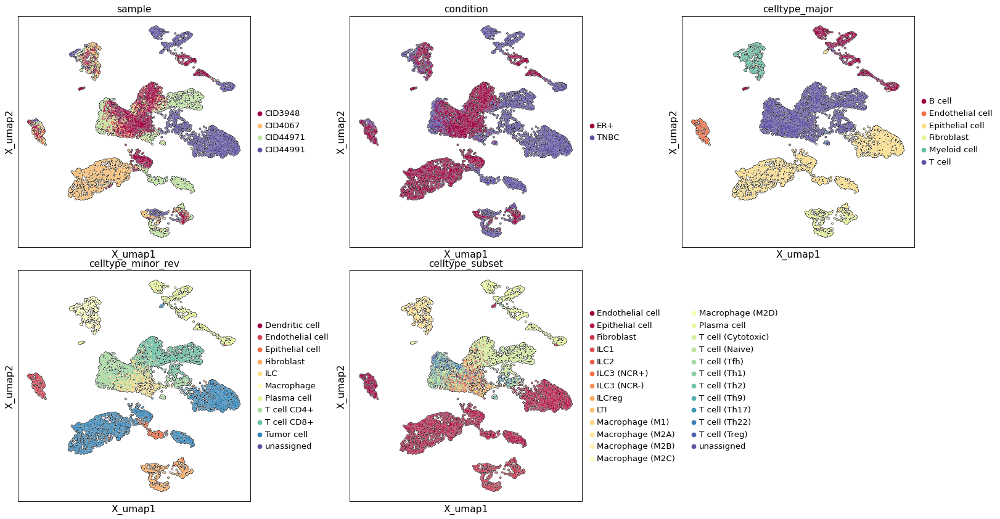

In [5]:
items_to_plot = ['sample', 'condition', 'celltype_major', 
                 'celltype_minor_rev', 'celltype_subset'] #, 'CD3D'] 

ws_hs = (0.3, 0.1)
# adata.obsm['X_umap'] = adata.obsm['X_org_umap']
sc.settings.set_figure_params(figsize=(6, 6), dpi=80, facecolor='white')
fig = sc.pl.embedding( adata, basis = 'X_umap', neighbors_key = 'neighbors',
                       color=items_to_plot, wspace = ws_hs[0], hspace = ws_hs[1], legend_fontsize = 12, 
                       ncols = 3, palette = 'Spectral', return_fig = True, add_outline = True) 

plt.show()

### Cell Population

In [69]:
celltype_col = 'celltype_minor_rev'
if celltype_col not in list(adata_t.obs.columns.values):
    celltype_col = 'celltype_minor_rev'

df_cnt, df_pct= get_population( adata_t.obs['sample'], 
                                adata_t.obs[celltype_col], sort_by = [] )
df_cnt

,Dendritic cell,Endothelial cell,Epithelial cell,Fibroblast,ILC,Macrophage,Plasma cell,T cell CD4+,T cell CD8+,Tumor cell,unassigned
CID3948,2,72,11,65,432,98,200,455,446,219,0
CID4067,0,100,8,120,171,151,0,81,146,1223,0
CID44971,0,48,163,181,110,143,11,568,538,238,0
CID44991,0,14,21,83,16,59,417,181,102,1106,1


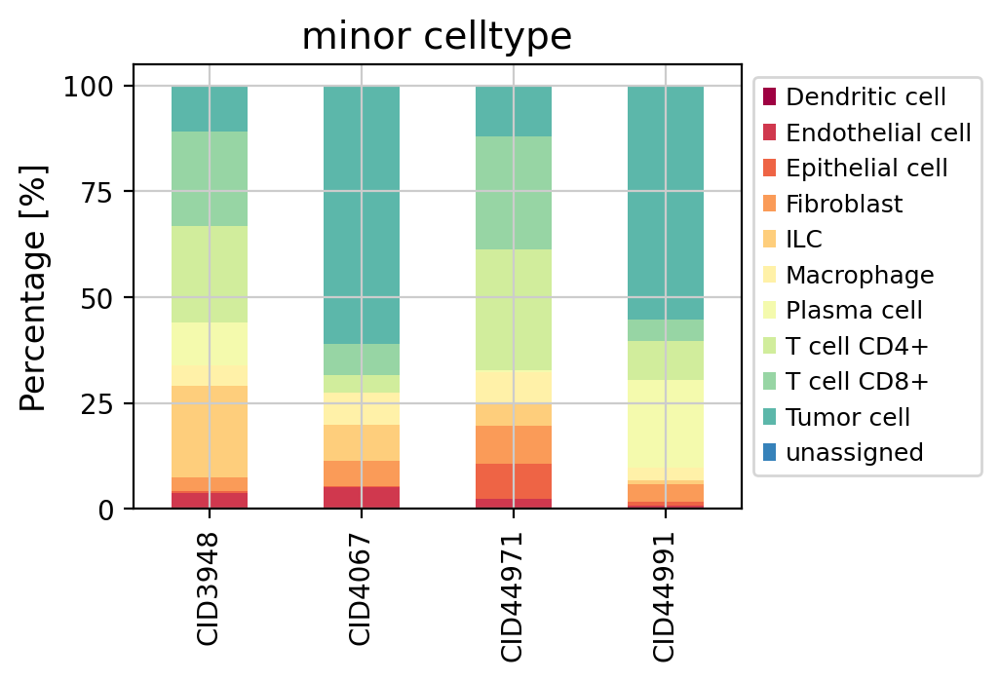

In [70]:
plot_population( df_pct, title = 'minor celltype', title_fs = 14, 
                 label_fs = 12, tick_fs = 10, tick_rot = 90,
                 legend_fs = 9, legend_loc = 'upper left', bbox_to_anchor = (1,1), 
                 legend_ncol = 1, cmap_name = None, figsize=(4, 3), return_fig = False)

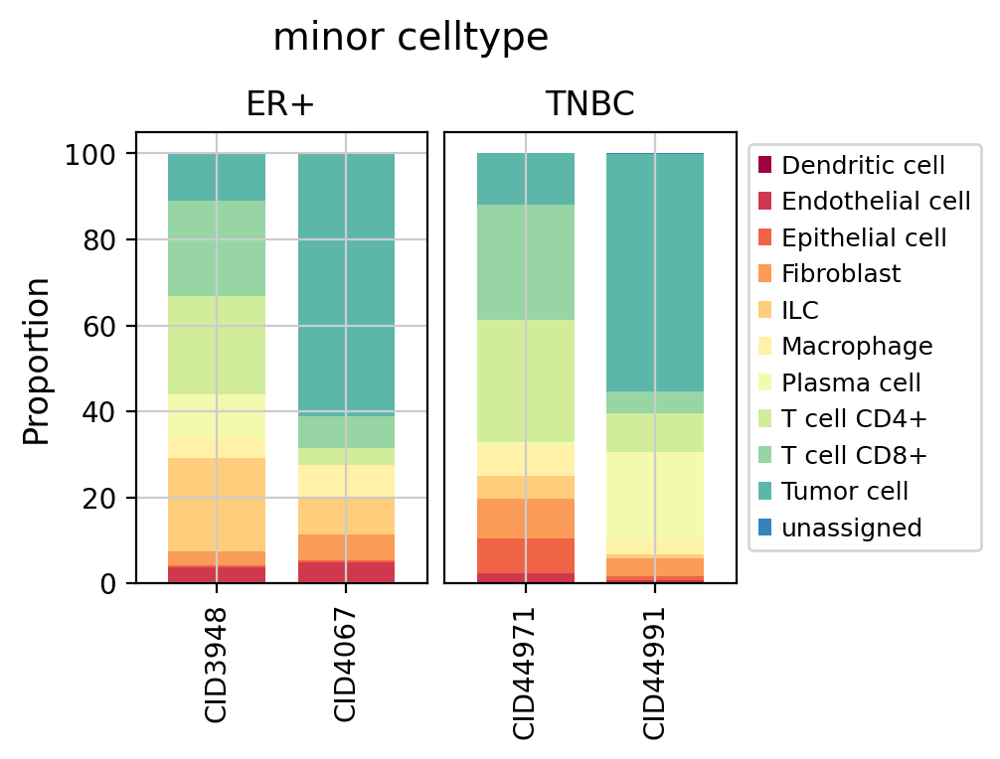

In [71]:
sg_map = {}
slst = list(df_cnt.index.values)
for s in slst:
    b = adata_t.obs['sample'] == s
    g = list(adata_t.obs.loc[b, 'condition'])[0]
    sg_map[s] = g
    
plot_population_grouped( df_pct, sg_map, sort_by = ['Tumor cell'], 
                         title = 'minor celltype', title_fs = 14, title_y = 1.1,
                         label_fs = 12, tick_fs = 10, tick_rot = 90,
                         legend_fs = 9, legend_loc = 'upper left', bbox_to_anchor = (1,1), 
                         legend_ncol = 1, cmap_name = None, figsize=(4, 3), return_fig = False)

In [9]:
## Tumor identification: UMAP, CNV heatmap, tumor markers, dotplot
lst = [adata_t.obs['celltype_minor'], adata_t.obs['celltype_major'], 
       adata_t.obs['tumor_dec'], adata_t.obs['celltype_minor_rev']]
plot_sankey_e( lst, title = None, fs = 13, WH = (800, 500), th = 10, title_y = 0.8 )
plt.show()

### Marker expression pattern

T cell (Naive): 8 > 1, T cell (Cytotoxic): 8 > 4, Fibroblast: 22 > 21, T cell (Th17): 16 > 2, T cell (Treg): 27 > 16, T cell (Th1): 15 > 4, Macrophage (M1): 32 > 2, ILCreg: 10 > 3, LTI: 17 > 7, T cell (Tfh): 19 > 8, Macrophage (M2A): 38 > 9, T cell (Th2): 17 > 2, Plasma cell: 10 > 8, Macrophage (M2C): 35 > 5, T cell (Th22): 13 > 2, ILC3 (NCR-): 10 > 0, Macrophage (M2B): 31 > 2, ILC1: 13 > 2, Macrophage (M2D): 26 > 0, T cell (Th9): 9 > 1, ILC3 (NCR+): 12 > 1, ILC2: 14 > 2
Num markers selected: 107 -> 107


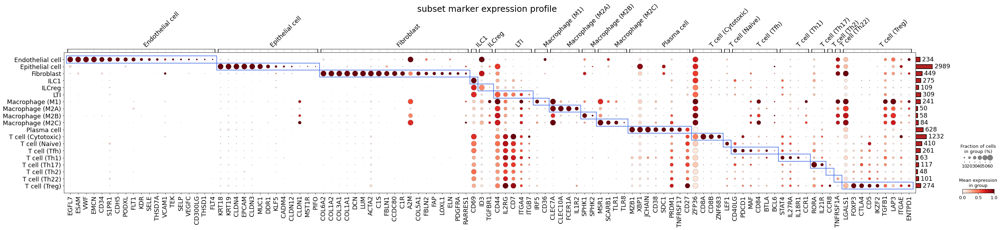

In [10]:
mkr_dict = copy.deepcopy( adata_t.uns['Celltype_marker_DB']['subset_markers_dict'] )
target_lst = list(adata_t.obs['celltype_subset'].unique())

title = 'subset marker expression profile  \n \n  \n \n '

pes, pexs, md = plot_marker_exp( adata_t, target_lst, 'celltype_subset', mkr_dict, title = title, 
                          rend = None, level = 0, cutoff = 0.05, pnsh12 = '100000', rem_cmn = True, 
                          dot_max = 0.6, fs_text = 16, swap_ax = False, to_exclude = [], 
                          comb_mkrs = False, vg_rot = 45, lw = 1.5, fs_title = 22, vg_hgt = 1.2, 
                          Npt = 20, Npt_tot = 200, ret_pe = True, legend = True,
                          type_level_g = None, other_genes = [], show_unassigned = False, 
                          add_rect = True, standard_scale = 'var', figsize = None )


### CNV & tumor cell identification

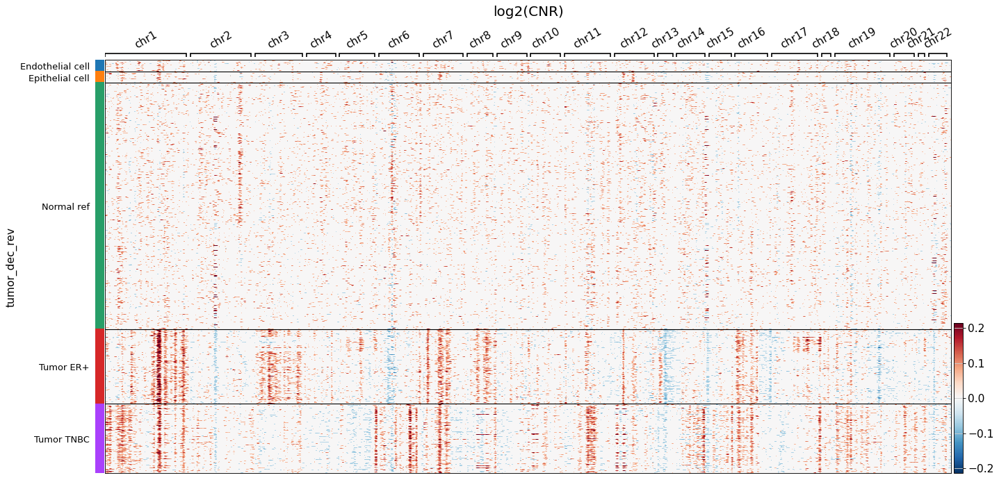

In [11]:
adata = adata_t[:,:]

cond_col = 'condition'
clst = adata.obs[cond_col].unique()
adata.obs['tumor_dec_rev'] = adata.obs['celltype_major'].copy(deep = True).astype(str)
b = adata.obs['tumor_dec_rev'].isin(adata.uns['cnv_ref_celltypes'])
adata.obs.loc[b, 'tumor_dec_rev'] = 'Normal ref'
for c in clst:
    b = (adata.obs[cond_col] == c) & (adata.obs['tumor_dec'] == 'Tumor')
    s = 'Tumor %s' % c
    adata.obs.loc[b, 'tumor_dec_rev'] = s

plot_cnv( adata, groupby = 'tumor_dec_rev', title_fs = 18, label_fs = 12,
          figsize = (20, 10), swap_axes = False, 
          var_group_rotation = 30, cmap='RdBu_r', vmax = 1)

### CNV UMAP

In [12]:
adata = adata_t[:,:]

N_pca = 15
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=N_pca, 
                use_rep = 'X_cnv_pca', key_added = 'cnv_neighbors')

ad_tmp = sc.tl.umap(adata, neighbors_key = 'cnv_neighbors', copy = True)    
adata.obsm['X_cnv_umap'] = ad_tmp.obsm['X_umap']

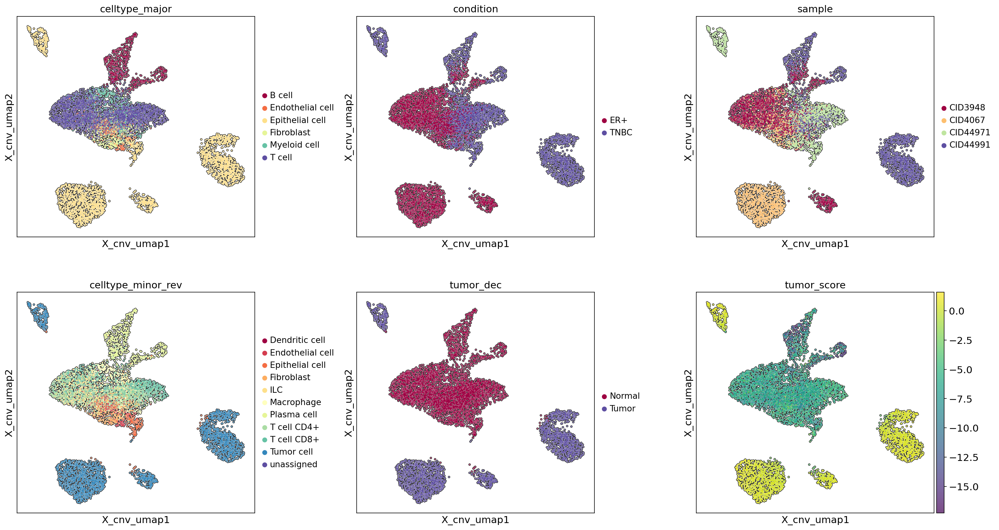

In [14]:
items_to_plot = ['celltype_major', 'condition', 'sample', 'celltype_minor_rev', 'tumor_dec', 'tumor_score'] 

sc.settings.set_figure_params(figsize=(6, 6), dpi=80, facecolor='white')
fig = sc.pl.embedding( adata, basis = 'X_cnv_umap', neighbors_key = 'cnv_neighbors',
                       color=items_to_plot, wspace = 0.3, legend_fontsize = 12, ncols = 3, 
                       palette = 'Spectral', return_fig = False, add_outline = True) 
plt.show()

In [15]:
adata_t.uns['cnv_addon_summary'].keys()

dict_keys(['adj_mat', 'agg_adj_mat', 'cnv_cluster_info', 'connectivity_threshold', 'tumor_dec_params'])

In [16]:
adata_t.uns['cnv_addon_summary']['cnv_cluster_info']

,cmean,ref_frac,tumor_dec,cluster_size,cluster_score,seed,selected,selection_order,paired_cluster,edge_wgt,threshold
cnv_cluster,,,,,,,,,,,
0,-5.411242,1,Normal,318,0.799941,True,True,7,3,61.5,0.193396
1,-7.963124,1,Normal,193,0.376179,True,True,10,8,22.9,0.118653
2,-6.588495,1,Normal,432,0.758731,True,True,5,6,64.3,0.148843
3,-6.343285,1,Normal,455,0.737807,True,True,4,5,124.7,0.274066
4,-7.212622,1,Normal,771,0.650607,True,True,0,10,93.2,0.171956
5,-7.372240,1,Normal,725,0.504929,True,True,1,3,124.7,0.274066
6,-6.694715,1,Normal,483,0.757569,True,True,3,4,81.0,0.167702
7,-7.343071,1,Normal,375,0.543516,True,True,6,2,44.2,0.117867
8,-9.943144,1,Normal,287,0.318105,True,True,8,1,22.9,0.118653


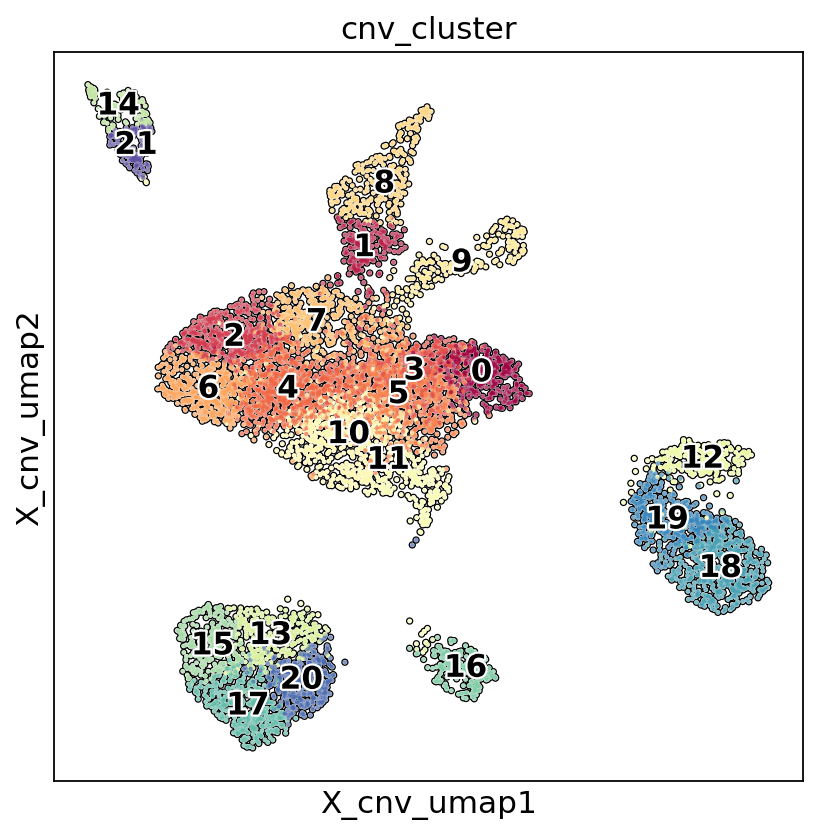

In [17]:
sc.pl.embedding( adata, basis = 'X_cnv_umap', add_outline = True, 
                 color="cnv_cluster", legend_loc="on data", legend_fontoutline=2)
plt.show()

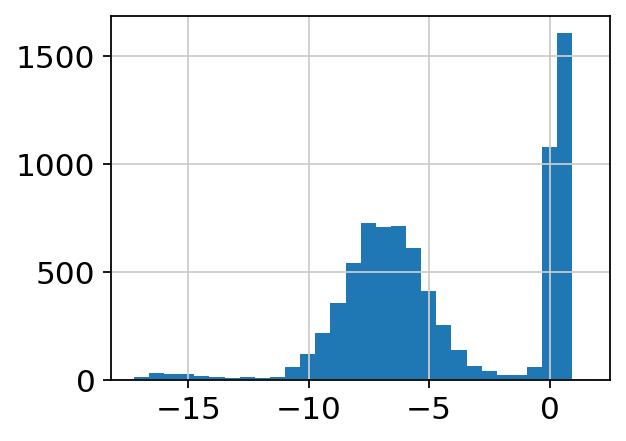

In [18]:
plt.figure(figsize = (4,3))
adata_t.obs['tumor_score'].hist(bins = 30)
plt.show()

### cell-cell interaction

In [19]:
df_dct = adata_t.uns['CCI']
cond_lst = list(df_dct.keys())
cond_lst

['ER+', 'TNBC']

In [21]:
df_dct[cond_lst[0]]

,gene_pair,cell_pair,gene_A,gene_B,cell_A,cell_B,pval,mean
ADM_RAMP3--Endothelial cell|Endothelial cell,ADM_RAMP3,Endothelial cell|Endothelial cell,ADM,RAMP3,Endothelial cell,Endothelial cell,0.000,0.9515
ADM_RAMP3--Endothelial cell|Epithelial cell,ADM_RAMP3,Endothelial cell|Epithelial cell,ADM,RAMP3,Endothelial cell,Epithelial cell,0.004,0.1885
ADM_RAMP3--Fibroblast|Endothelial cell,ADM_RAMP3,Fibroblast|Endothelial cell,ADM,RAMP3,Fibroblast,Endothelial cell,0.000,0.4370
ADM_RAMP3--Fibroblast|Epithelial cell,ADM_RAMP3,Fibroblast|Epithelial cell,ADM,RAMP3,Fibroblast,Epithelial cell,0.068,0.0830
ADM_RAMP3--Macrophage|Endothelial cell,ADM_RAMP3,Macrophage|Endothelial cell,ADM,RAMP3,Macrophage,Endothelial cell,0.000,1.1140
...,...,...,...,...,...,...,...,...
integrin_aVb1_complex_ADGRE5--Fibroblast|T cell CD8+,integrin_aVb1_complex_ADGRE5,Fibroblast|T cell CD8+,integrin,aVb1,Fibroblast,T cell CD8+,0.000,0.3790
integrin_aVb1_complex_ADGRE5--Macrophage|ILC,integrin_aVb1_complex_ADGRE5,Macrophage|ILC,integrin,aVb1,Macrophage,ILC,0.000,0.3155
integrin_aVb1_complex_ADGRE5--Macrophage|Macrophage,integrin_aVb1_complex_ADGRE5,Macrophage|Macrophage,integrin,aVb1,Macrophage,Macrophage,0.000,0.1760
integrin_aVb1_complex_ADGRE5--Macrophage|T cell CD4+,integrin_aVb1_complex_ADGRE5,Macrophage|T cell CD4+,integrin,aVb1,Macrophage,T cell CD4+,0.012,0.2560


In [22]:
df_lst = cci_get_ni_mat( df_dct, remove_common = False )

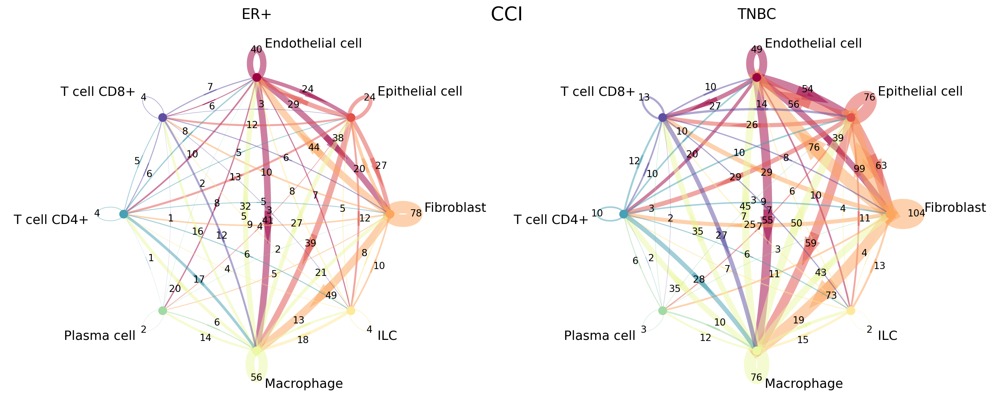

In [23]:
plot_cci_circ_m( df_lst, ncol = 2, figsize = (8,7), title = 'CCI', title_y = 1.02, 
                   title_fs = 24, text_fs = 16, num_fs = 12, margin = 0.08, alpha = 0.5, 
                   N = 500, R = 3, Rs = 0.1, lw_max = 20, lw_scale = 0.2, log_lw = False, 
                   node_size = 10, rot = False, cmap = 'Spectral', ws_hs = (0.35, 0.1) )

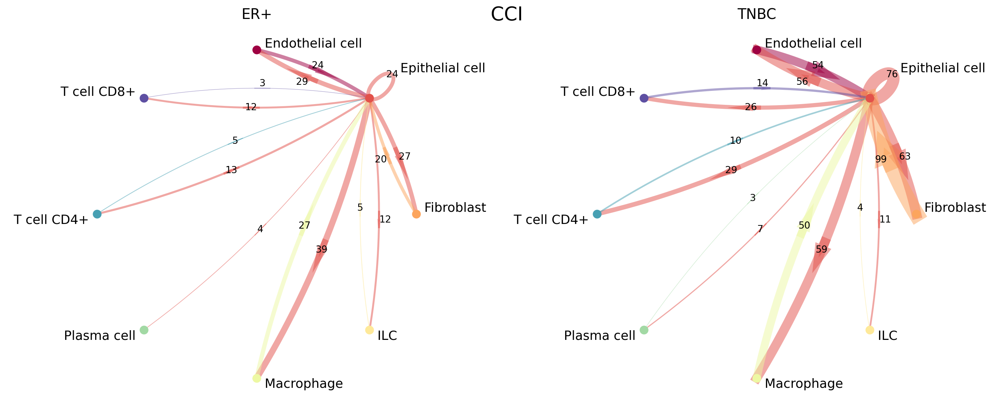

In [24]:
target = 'Epithelial cell'
df_lst2 = {}
for key in df_lst.keys():
    df = df_lst[key]
    msk = df.copy(deep = True)
    msk.loc[:,:] = 0
    msk.loc[target,:] = 1
    msk.loc[:,target] = 1
    df_lst2[key] = df*msk
    
plot_cci_circ_m( df_lst2, ncol = 2, figsize = (8,7), title = 'CCI', title_y = 1.02, 
                   title_fs = 24, text_fs = 16, num_fs = 12, margin = 0.08, alpha = 0.5, 
                   N = 500, R = 3, Rs = 0.1, lw_max = 20, lw_scale = 0.2, log_lw = False, 
                   node_size = 10, rot = False, cmap = 'Spectral', ws_hs = (0.35, 0.1) )

In [25]:
idx_dct = {}
for g in df_dct.keys():
    idx_dct[g] = list(df_dct[g].index.values)

idx1 = idx_dct[cond_lst[0]]
idx2 = idx_dct[cond_lst[1]]
idxc = list(set(idx1).intersection(idx2))

len(idxc), len(idx1), len(idx2)

(669, 915, 1577)

'Union of Interactions: 592'

15 cell_pairs, 286 gene_pairs found


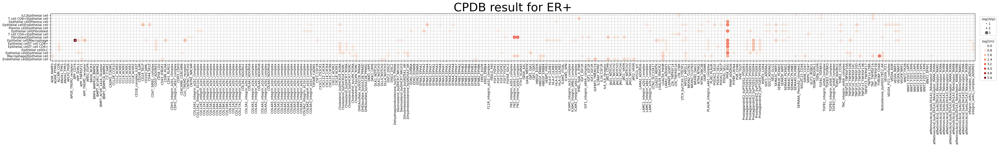

15 cell_pairs, 286 gene_pairs found


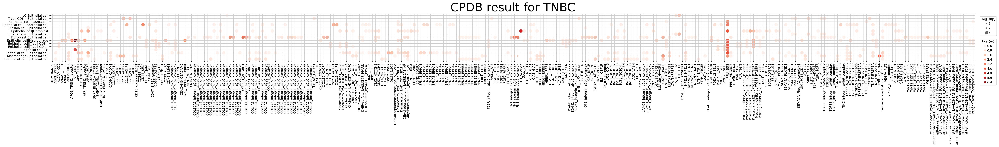

In [26]:
df_dct_to_plot = cci_get_df_to_plot( df_dct, target_cells = ['Epithelial cell'], 
                                     pval_cutoff = 0.01, mean_cutoff = 1 )

## CCI: circle plot, dotplot, pairwise venn diagram
for g in df_dct_to_plot.keys():
    
    dfv = df_dct_to_plot[g]
    idxs = list(dfv.index.values)
    
    dfs = dfv.sort_values(by = ['gene_pair', 'cell_pair'])
    
    ax = plot_cci_dot( dfs, mkr_sz = 9, tick_sz = 9, 
                       legend_fs = 9, title_fs = 34, dpi = 120,
                       title = 'CPDB result for %s' % g, swap_ax = True )

### DEG

In [27]:
adata_t

AnnData object with n_obs × n_vars = 8000 × 29733
    obs: 'Patient', 'Percent_mito', 'nCount_RNA', 'nFeature_RNA', 'celltype_major', 'celltype_minor', 'celltype_subset', 'subtype', 'gene_module', 'Calls', 'normal_cell_call', 'CNA_value', 'sample', 'condition', 'cnv_cluster', 'tumor_dec', 'tumor_score', 'y_conf', 'y_conf_gmm', 'celltype_minor_rev'
    var: 'gene_ids'
    uns: 'CCI', 'Celltype_marker_DB', 'DEG', 'DEG_stat', 'GSA_down', 'GSA_up', 'GSEA', 'cnv', 'cnv_addon_summary', 'cnv_ref_celltypes'
    obsm: 'HiCAT_result', 'X_cnv', 'X_cnv_pca', 'cnv_addon_results'

In [28]:
nc_deg_dct = adata_t.uns['DEG_stat']
df_deg_dct = adata_t.uns['DEG']
df_deg_dct.keys()

dict_keys(['Epithelial cell', 'Fibroblast', 'ILC', 'Macrophage', 'Plasma cell', 'T cell CD4+', 'T cell CD8+'])

In [29]:
target_cell = 'Epithelial cell'

df_deg = df_deg_dct[target_cell]
nc_deg = nc_deg_dct[target_cell]

nc_deg

{'ER+_vs_others': {'ER+': 690, 'others': 861},
 'TNBC_vs_others': {'TNBC': 861, 'others': 690}}

In [31]:
clst = list(df_deg.keys())
clst

['ER+_vs_others', 'TNBC_vs_others']

In [32]:
df_deg[clst[0]]

,log2_FC,pval,pval_adj,mean_test,mean_ref,nz_pct_test,nz_pct_ref,nz_pct_score,Rp
AGR3,6.296000,4.616999e-262,5.135950e-258,1.977425,0.076209,0.892754,0.055749,0.795988,0.893
ESR1,6.706000,2.668721e-232,2.968686e-228,1.691829,0.041565,0.856522,0.045296,0.780685,0.857
ADIRF,6.566000,0.000000e+00,0.000000e+00,2.690847,0.135498,0.972464,0.140534,0.718341,0.972
PIP,6.245000,6.082385e-173,6.766045e-169,2.399781,0.124070,0.818841,0.077816,0.696360,0.819
CRIP1,5.742000,1.243359e-184,1.383112e-180,1.237418,0.044698,0.737681,0.072009,0.635266,0.738
...,...,...,...,...,...,...,...,...,...
GLYATL2,-29.181999,1.853384e-14,2.061704e-10,0.000000,0.059136,0.000000,0.073171,0.000000,0.000
FTH1,-1.013000,2.192104e-52,2.438497e-48,3.874675,4.566070,0.975362,1.000000,0.000000,0.975
GULP1,-29.622000,1.260690e-25,1.402392e-21,0.000000,0.079399,0.000000,0.130081,0.000000,0.000
FOLR1,-30.118999,1.481462e-25,1.647979e-21,0.000000,0.110303,0.000000,0.124274,0.000000,0.000


Epithelial cell


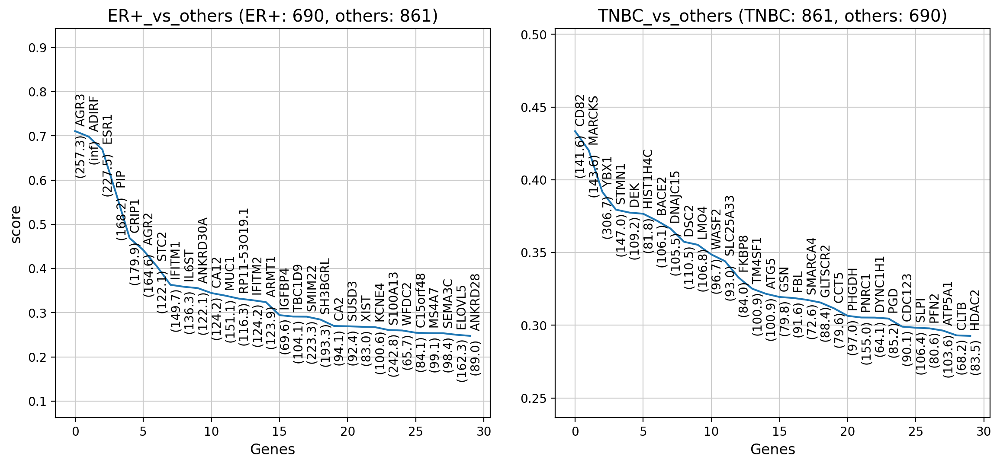

Fibroblast


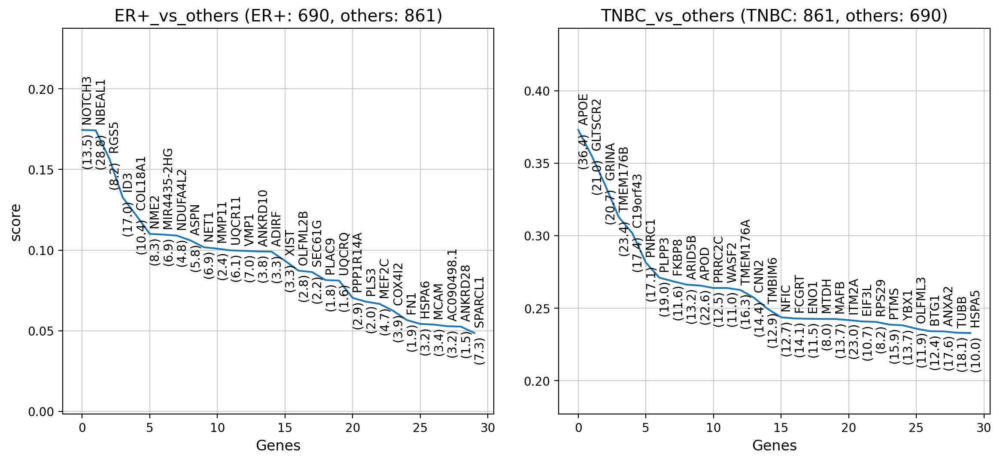

ILC


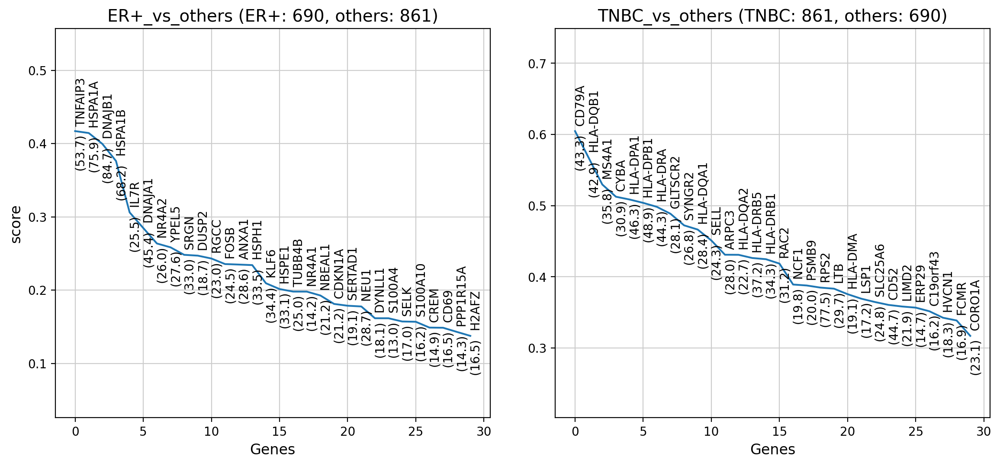

Macrophage


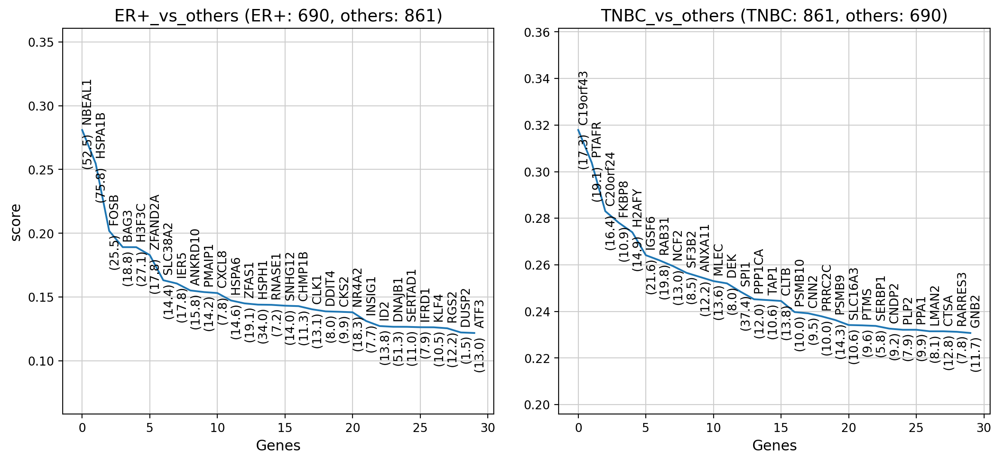

Plasma cell


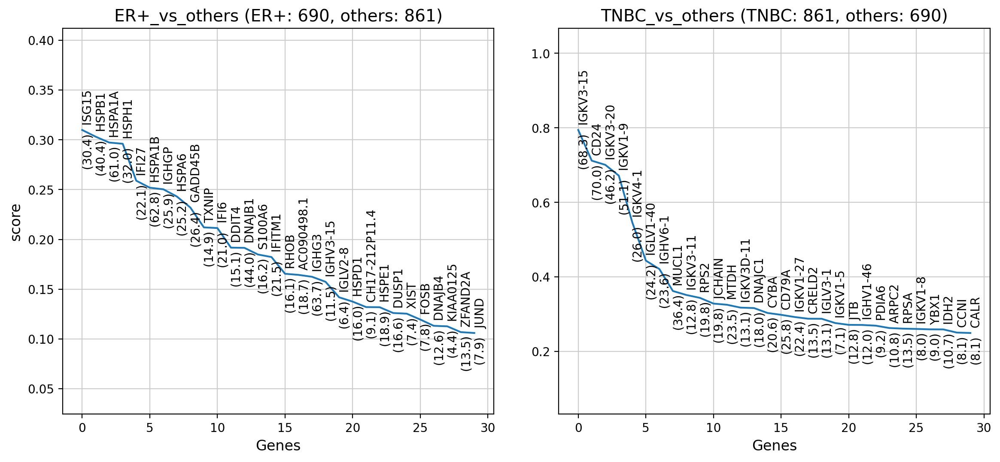

T cell CD4+


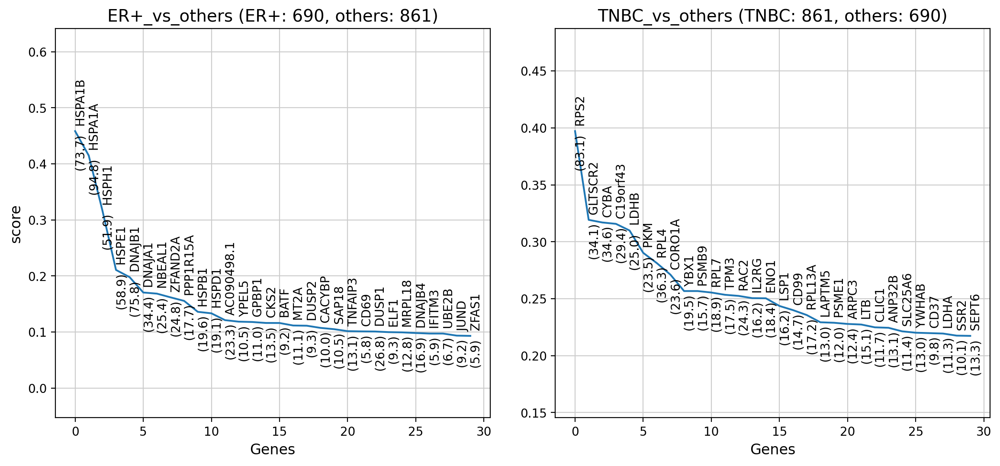

T cell CD8+


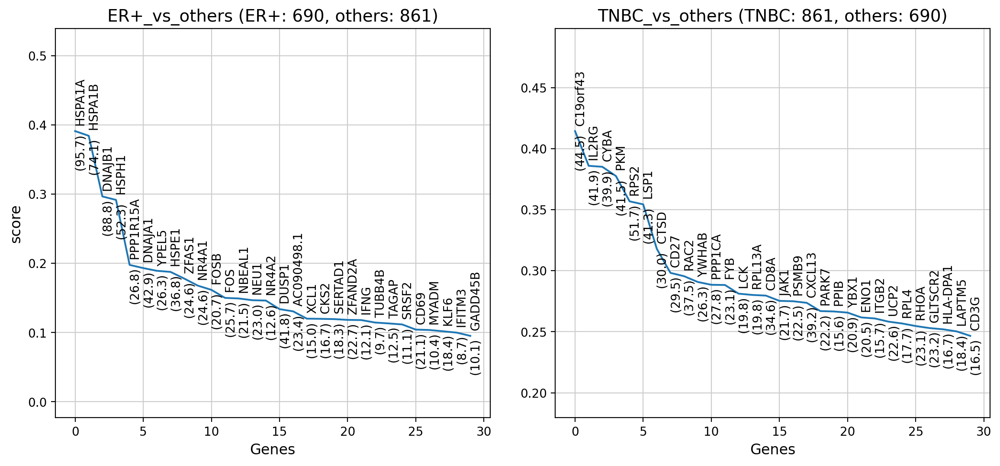

In [62]:
for key in df_deg_dct.keys():
    df_deg = df_deg_dct[key]
    for k in df_deg.keys():
        df_deg[k]['score'] = df_deg[k]['nz_pct_score']*df_deg[k]['Rp']

    print(key)
    plot_deg( df_deg, value = 'score', n_genes = 30, pval_cutoff = 0.05, 
              figsize = (6,5), text_fs = 10, title_fs = 14, label_fs = 12, 
              tick_fs = 10, ncol = 2, ws_hs = (0.15, 0.2), deg_stat_dct = nc_deg )


In [64]:
target_cell = 'Epithelial cell'

df_deg = df_deg_dct[target_cell]
nc_deg = nc_deg_dct[target_cell]

mkr_dict = get_markers_from_deg( df_deg, N_mkrs = 30, rem_common = True )

## Print results   
for key in mkr_dict.keys():
    print('%s (%i): ' % (key, len(mkr_dict[key])), mkr_dict[key])        


ER+ (30):  ['ANKRD28', 'ARMT1', 'TBC1D9', 'XIST', 'MS4A7', 'S100A13', 'SUSD3', 'IL6ST', 'RP11-53O19.1', 'SEMA3C', 'SH3BGRL', 'STC2', 'KCNE4', 'CA12', 'ANKRD30A', 'ELOVL5', 'SMIM22', 'CA2', 'ADIRF', 'AGR2', 'IFITM2', 'WFDC2', 'IFITM1', 'PIP', 'AGR3', 'MUC1', 'ESR1', 'C15orf48', 'CRIP1', 'IGFBP4']
TNBC (30):  ['PHGDH', 'CDC123', 'HIST1H4C', 'SLPI', 'DYNC1H1', 'MARCKS', 'CD82', 'GSN', 'ATP5A1', 'WASF2', 'YBX1', 'STMN1', 'GLTSCR2', 'SLC25A33', 'LMO4', 'CLTB', 'BACE2', 'ATG5', 'DNAJC15', 'TM4SF1', 'HDAC2', 'FBL', 'FKBP8', 'DSC2', 'PFN2', 'DEK', 'PNRC1', 'PGD', 'CCT5', 'SMARCA4']


In [65]:
## Select cells
target_cell = 'Epithelial cell'

adata_s = adata_t[:,:]
b = adata_s.obs['celltype_minor'] == target_cell

adata_s = adata_s[b,:]

In [66]:
sample_col = 'sample'
cond_col = 'condition'

## Assign new sample name with subtype prefix
slst = list(adata_s.obs[sample_col])
clst = list(adata_s.obs[cond_col])

plst2 = []
for s, c in zip(slst, clst):
    plst2.append('%8s - %s' % (c, s))
        
pid_field = 'pid_e'
adata_s.obs[pid_field] = plst2

## Select samples with its No. of cells greater than 40
pcnt = adata_s.obs[pid_field].value_counts()
b = pcnt >= 100
plst = list(pcnt.index.values[b])

# display(pcnt[plst])
print('N_samples: ', len(plst), 'ave. N_cells: ', pcnt[plst].mean())

b = adata_s.obs[pid_field].isin(plst)
adata_ss = adata_s[b,:]

N_samples:  4 ave. N_cells:  742.25


In [38]:
adata_ss.obs['pid_e'].value_counts()

     ER+ - CID4067     1231
    TNBC - CID44991    1127
    TNBC - CID44971     401
     ER+ - CID3948      230
Name: pid_e, dtype: int64

Num markers selected: 60 -> 60


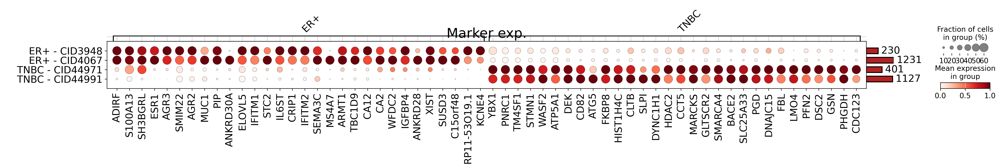

In [40]:
type_col = cond_col 
target_lst = list(adata_ss.obs[type_col].unique())
target_lst.sort()
title = 'Marker exp.'

pes, pexs, md = plot_marker_exp( adata_ss, target_lst, type_col, mkr_dict, title = title, 
                          rend = None, level = 0, cutoff = 0.05, pnsh12 = '100000', 
                          rem_cmn = True, 
                          dot_max = 0.6, fs_text = 16, swap_ax = False, to_exclude = [], 
                          comb_mkrs = False, vg_rot = 45, lw = 1.5, fs_title = 22, vg_hgt = 1.2, 
                          Npt = 20, Npt_tot = 200, ret_pe = True, legend = True,
                          type_level_g = 'pid_e', other_genes = [], show_unassigned = False, 
                          add_rect = False, standard_scale = 'var', figsize = None )
plt.show()

### GSEA

In [47]:
df_dct_enr_up = adata_t.uns['GSA_up']
df_dct_enr_dn = adata_t.uns['GSA_down']
# df_dct_enrichr = adata_t.uns['GSA']

In [48]:
df_dct_enr_up.keys()

dict_keys(['Epithelial cell', 'Fibroblast', 'Macrophage', 'Plasma cell', 'T cell CD4+', 'T cell CD8+'])

In [49]:
target_cell = 'Epithelial cell'
df_dct_enr_up[target_cell].keys()

dict_keys(['ER+_vs_others', 'TNBC_vs_others'])

In [50]:
df_res_enr = df_dct_enr_up[target_cell]['TNBC_vs_others']
df_res_enr

,Gene_set,Overlap,P-value,Adjusted P-value,Odds Ratio,Genes,-log(p-val),-log(q-val),Term,Ind
Term,,,,,,,,,,
AGE-RAGE signaling pathway in diabetic complications,CUSTOM140170460932160,27/99,2.809296e-03,7.444635e-03,1.738762,EDN1;PIM1;CDC42;TNF;CDK4;TGFBR1;PIK3R1;F3;STAT...,2.551402,2.128157,AGE-RAGE signaling pathway in diabetic complic...,1
AMPK signaling pathway,CUSTOM140170460932160,28/118,1.764115e-02,3.642784e-02,1.512414,EEF2K;AKT1S1;FOXO3;PPP2R5B;PFKM;MLYCD;CCNA2;PI...,1.753473,1.438567,AMPK signaling pathway,1
Acute myeloid leukemia,CUSTOM140170460932160,20/67,3.079195e-03,7.960845e-03,1.909873,TCF7L2;PML;IKBKG;KIT;PIM1;CCNA2;PIK3R1;CEBPA;Z...,2.511563,2.099041,Acute myeloid leukemia,1
Adherens junction,CUSTOM140170460932160,28/66,2.740272e-07,1.815430e-06,2.699786,IQGAP1;CSNK2A1;ACTB;ACTN4;CDC42;VCL;ACP1;TGFBR...,6.562206,5.741020,Adherens junction,1
Adipocytokine signaling pathway,CUSTOM140170460932160,16/68,6.594039e-02,1.152145e-01,1.513439,NFKBIB;IKBKG;PRKAA2;NFKBIE;PCK2;TRADD;PRKAG1;P...,1.180849,0.938493,Adipocytokine signaling pathway,1
...,...,...,...,...,...,...,...,...,...,...
Yersinia infection,CUSTOM140170460932160,40/134,3.787148e-05,1.584623e-04,1.897363,IKBKG;ACTB;ARPC3;ITGB1;NFATC3;CDC42;TNF;CASP1;...,4.421688,3.800074,Yersinia infection,1
beta-Alanine metabolism,CUSTOM140170460932160,8/30,9.259605e-02,1.535998e-01,1.750296,ALDH7A1;SMOX;HIBCH;HADHA;ALDH3B2;MLYCD;ALDH9A1...,1.033408,0.813609,beta-Alanine metabolism,1
mRNA surveillance pathway,CUSTOM140170460932160,35/95,5.982165e-07,3.804657e-06,2.342893,PABPC1;PELO;DAZAP1;SRRM1;UPF3B;PPP2R5B;CSTF2T;...,6.223142,5.419685,mRNA surveillance pathway,1


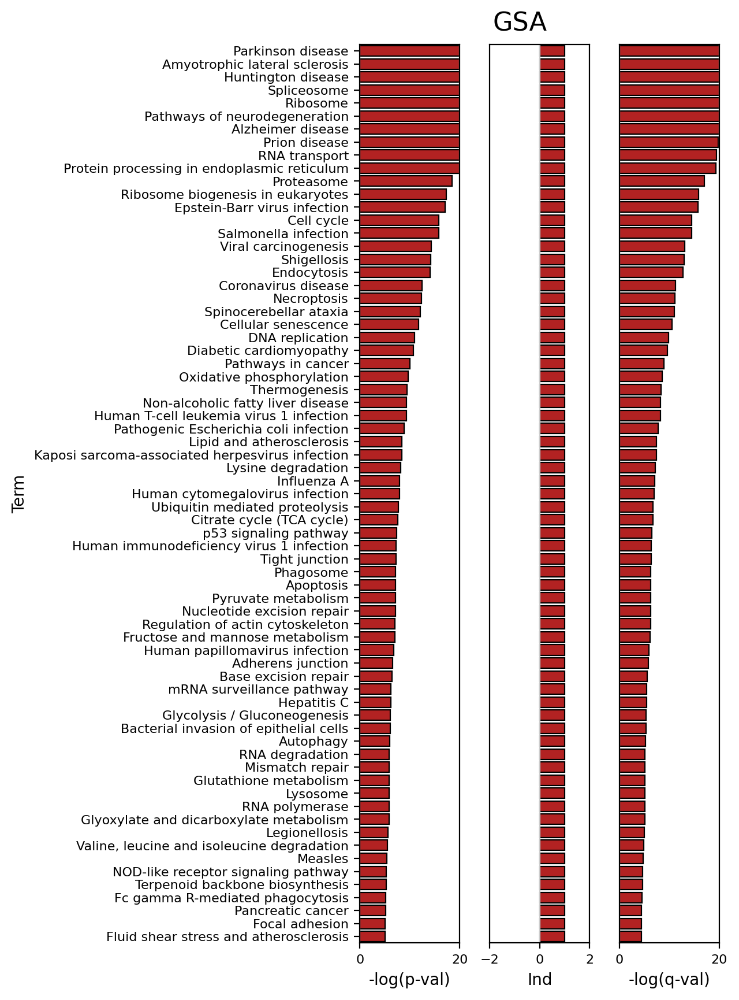

True

In [51]:
df_res = df_res_enr.copy(deep = True)
df_res = df_res.loc[df_res['-log(p-val)'] >= 5 ]

terms_sel = list(df_res.index.values)
items_to_plot = ['-log(p-val)', 'Ind', '-log(q-val)'] # , 'NES'
lims = [[0, 20], [-2, 2], [0, 20]] # , [-5, 5]

df_res = df_res.sort_values(by = '-log(p-val)', ascending = False)

plot_gsea_res( df_res, terms_sel, items_to_plot, lims, title = 'GSA',
               title_pos = (0.5, 1), title_fs = 16, title_ha = 'center',
               Ax = None)

### plot GSEA results

In [52]:
df_dct_prerank = adata_t.uns['GSEA']
df_dct_prerank.keys()

dict_keys(['Epithelial cell', 'Fibroblast', 'Macrophage', 'Plasma cell', 'T cell CD4+', 'T cell CD8+'])

In [53]:
target_cell = 'Epithelial cell'
df_dct_prerank[target_cell].keys()

dict_keys(['ER+_vs_others', 'TNBC_vs_others'])

In [54]:
df_res_pr = df_dct_prerank[target_cell]['TNBC_vs_others']
df_res_pr

,Name,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes,-log(p-val),-log(q-val),Term
Term,,,,,,,,,,,,
Glycosphingolipid biosynthesis,prerank,0.818422,1.723419,0.014327,1.000000,0.568,3/12,2.49%,B3GNT5;FUT3;B3GNT3,1.843855,-0.000000,Glycosphingolipid biosynthesis
Staphylococcus aureus infection,prerank,0.799713,1.718387,0.013514,0.622469,0.599,6/17,6.19%,KRT17;C1S;DSG1;KRT14;KRT16;DEFB1,1.869232,0.205882,Staphylococcus aureus infection
Ether lipid metabolism,prerank,0.799614,1.689573,0.016461,0.676506,0.747,6/14,9.55%,UGT8;PLA2G7;LPCAT2;PLA2G2A;PLPP3;PLD1,1.783546,0.169728,Ether lipid metabolism
Wnt signaling pathway,prerank,0.658347,1.638596,0.005537,1.000000,0.931,7/61,3.57%,SFRP1;MMP7;RSPO3;DKK1;PRICKLE1;WNT6;TCF7L1,2.256718,-0.000000,Wnt signaling pathway
Viral protein interaction with cytokine and cytokine receptor,prerank,0.760706,1.636021,0.019330,0.832383,0.936,9/19,9.47%,CX3CL1;CXCL1;CXCL8;CXCL3;CXCL2;IL34;IL2RG;CCL2...,1.713770,0.079677,Viral protein interaction with cytokine and cy...
Ras signaling pathway,prerank,0.642544,1.627703,0.005388,0.765702,0.950,12/71,7.31%,EGFR;KIT;GNG4;RGL1;RASGRF1;PAK3;FGFR4;MRAS;GNG...,2.268578,0.115940,Ras signaling pathway
Primary bile acid biosynthesis,prerank,0.789506,1.577259,0.074453,1.000000,0.993,4/8,12.79%,CYP39A1;CYP7B1;CYP27A1;AMACR,1.128120,-0.000000,Primary bile acid biosynthesis
NF-kappa B signaling pathway,prerank,0.650767,1.556462,0.026286,1.000000,0.998,7/44,5.32%,PLAU;CXCL1;LBP;CXCL8;CXCL3;CXCL2;CD14,1.580280,-0.000000,NF-kappa B signaling pathway
Neuroactive ligand-receptor interaction,prerank,0.691974,1.554920,0.043956,1.000000,0.998,15/25,15.88%,GABRP;TACR1;CHRM3;NMB;CHRNA5;ADORA2B;P2RY6;EDN...,1.356981,-0.000000,Neuroactive ligand-receptor interaction


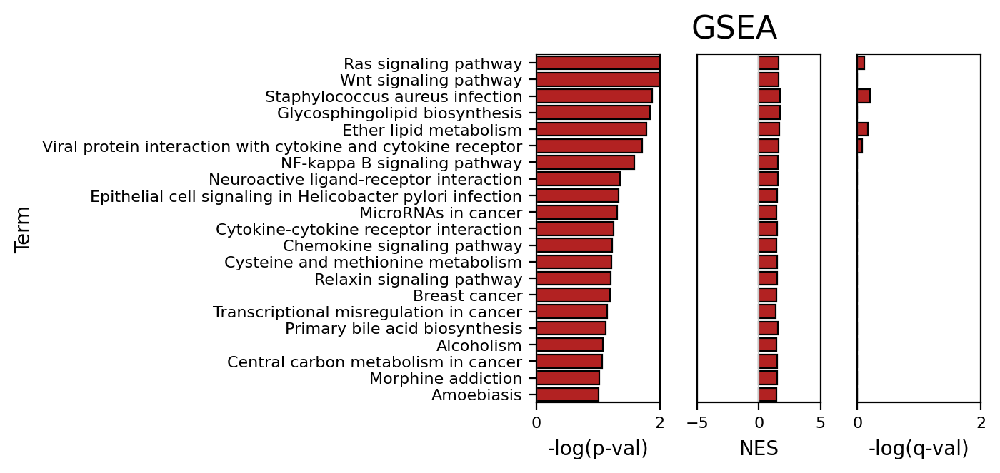

True

In [55]:
df_res = df_res_pr.copy(deep = True)
terms_sel = list(df_res.index.values)
items_to_plot = ['-log(p-val)', 'NES', '-log(q-val)']
lims = [[0, 2], [-5, 5], [0, 2]]

df_res = df_res.sort_values(by = '-log(p-val)', ascending = False)

plot_gsea_res( df_res, terms_sel, items_to_plot, lims, title = 'GSEA',
               title_pos = (0.5, 1), title_fs = 16, title_ha = 'center',
               Ax = None)

### plot GSEA summary

In [56]:
gsea_res = adata_t.uns['GSEA']
gsea_res.keys()

dict_keys(['Epithelial cell', 'Fibroblast', 'Macrophage', 'Plasma cell', 'T cell CD4+', 'T cell CD8+'])

In [57]:
df_qv, df_es = get_gsea_summary(gsea_res, max_log_p = 10)

,Epithelial cell: ER+_vs_others,Epithelial cell: TNBC_vs_others,Fibroblast: ER+_vs_others,Fibroblast: TNBC_vs_others,Macrophage: ER+_vs_others,Macrophage: TNBC_vs_others,Plasma cell: ER+_vs_others,Plasma cell: TNBC_vs_others,T cell CD4+: ER+_vs_others,T cell CD4+: TNBC_vs_others,T cell CD8+: ER+_vs_others,T cell CD8+: TNBC_vs_others
Yersinia infection,0.000000,0.000000,0.000000,0.000000,1.745075,1.772322,0.0,0.0,0.0,0.0,0.0,0.0
Wnt signaling pathway,2.182320,2.256718,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
Viral protein interaction with cytokine and cytokine receptor,1.745967,1.713770,1.070428,1.091614,1.575957,1.798713,0.0,0.0,0.0,0.0,0.0,0.0
Vascular smooth muscle contraction,0.000000,0.000000,1.580735,1.499023,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
Ubiquitin mediated proteolysis,0.000000,0.000000,1.343901,1.478566,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0


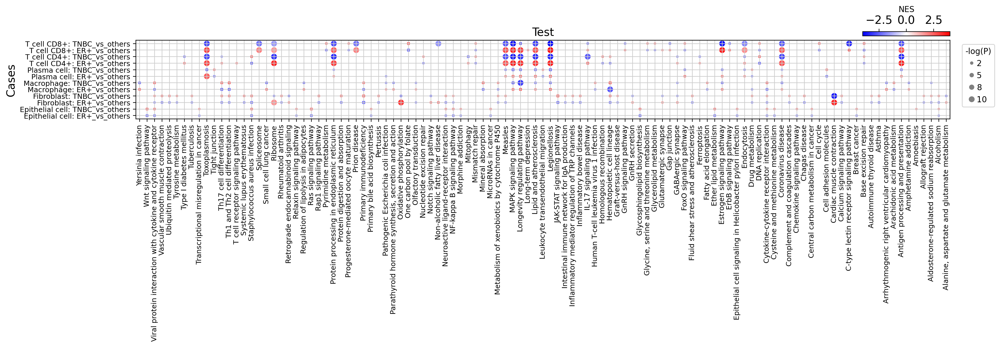

In [58]:
plot_gsea_all( df_qv, df_es, title = 'Test', title_fs = 14, 
               tick_fs = 9, tick_rot = 90, tick_ha = 'center',
               label_fs = 10, legend_fs = 10, swap_ax = True, 
               dot_size = 40, fig_size_sf = 1 )